# 🐕 End-to-end Multi-class Dog Bredd Classification

This notebook builds an end-to-end multi-class image classification
using TensorFlow 2.0 and TensorFlow Hub.

## Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting in the garden and I took a photo of a dog,
I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's Dog Breed Identification.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each
dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 4. Features

Some information about the data:
* We're dealing with images(unstructured data) so it's probably best
we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images
have labels).
* There are around 10,000+ images in the test set (these images have no
labels, because we'll want to predict them).


In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.18.0


In [ ]:
# Import necessary tools
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

TF Hub version: 0.16.1


In [ ]:
# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not availabe")

GPU available


## Getting our data ready (turing into Tensors)

With all machine learning models, our data has to be in numberical
format. So that's what we'll be doing first. Turning our images into
Tensors (numrical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Deep Learning/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.shape

(10222, 2)

<Axes: xlabel='breed'>

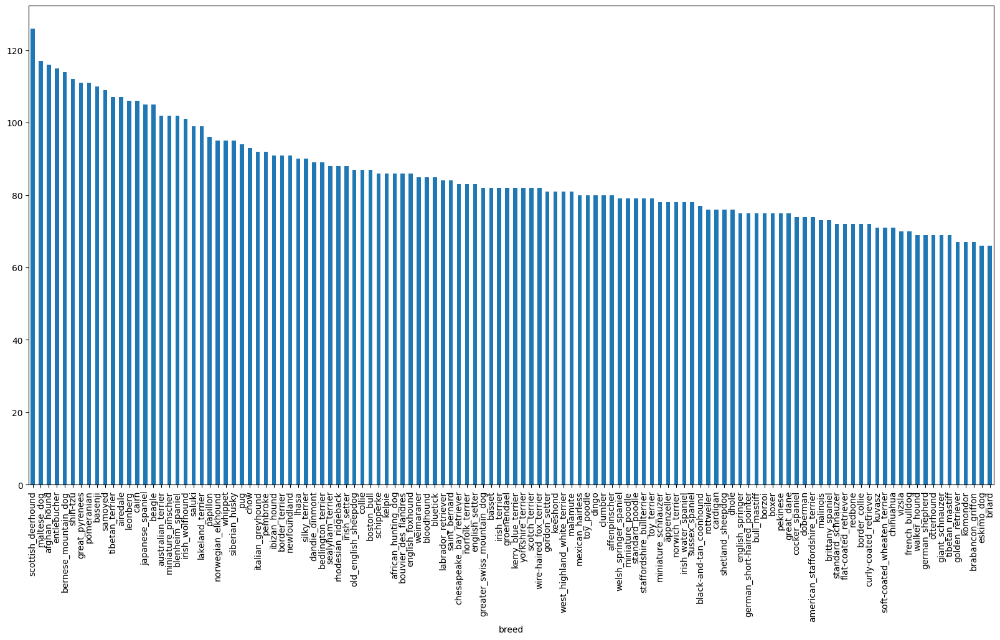

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


In [ ]:
print(labels_csv["breed"].value_counts().median())
print(labels_csv["breed"].value_counts().mean())

82.0
85.18333333333334


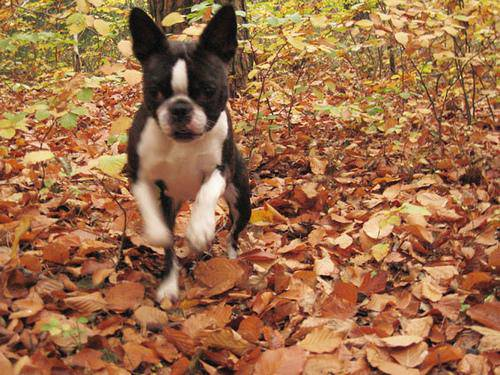

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Deep Learning/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels
Let's get a list of all of our image file pathnames

In [ ]:
# Create pathnames from imgae ID's
filenames = ["drive/MyDrive/Deep Learning/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Deep Learning/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(filenames)

10222

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Deep Learning/dog-breed-identification/train/"))== len(filenames):
 print("Filenames match actual amount of images files!!! Proceed.")
else:
  print("Filenames do no match actual amount ot files, check the target directory.")

Filenames match actual amount of images files!!! Proceed.


In [ ]:
len(os.listdir("drive/MyDrive/Deep Learning/dog-breed-identification/train/"))

10222

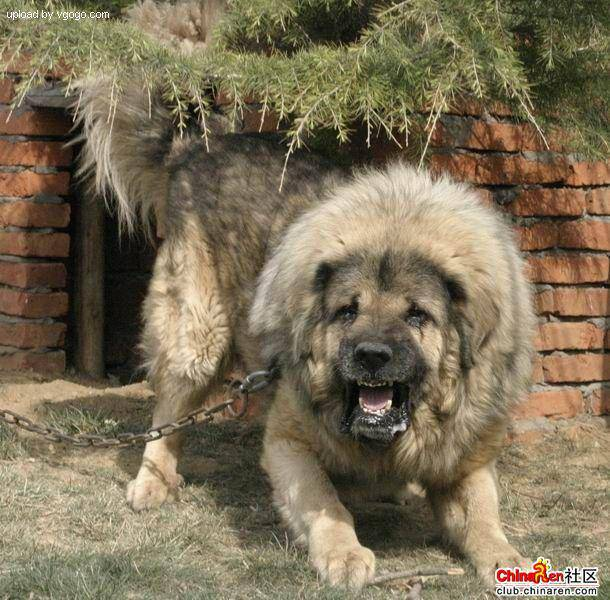

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

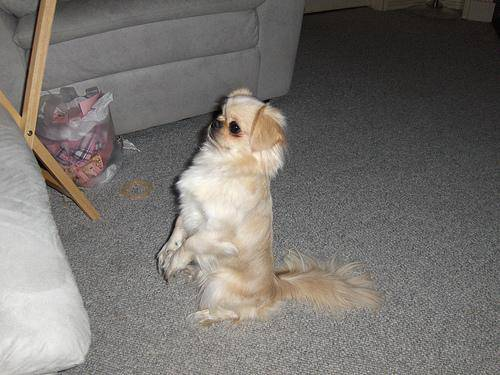

In [ ]:
Image(filenames[2])

In [ ]:
labels_csv['breed'][2]

'pekinese'

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.dtypes

,0
id,object
breed,object


Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames.
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames.")
else:
  print("Number of labels does not match number of filenames.")

Number of labels matches number of filenames.


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
print(np.where(unique_breeds == labels[0])[0][0])


19


In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turing boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].argmax())
print(boolean_labels[2].astype(int))

pekinese
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:5]

['drive/MyDrive/Deep Learning/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going
to create our own

In [ ]:
# Setup X and Y variables
X = filenames
Y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
 # Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}


In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES],
                                                 Y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(Y_train), len(Y_val)

(800, 200, 800, 200)

In [ ]:
NUM_IMAGES

1000

In [ ]:
# Les's have a geez at the trainig data
X_train[:5], Y_train[:2]

(['drive/MyDrive/Deep Learning/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Deep Learning/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Deep Learning/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Deep Learning/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Deep Learning/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fals

## Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a funciton which does a few things:
1. Take an imgae filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpeg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like

In [ ]:
filenames[42]

'drive/MyDrive/Deep Learning/dog-breed-identification/train/011e06760794850c40f23d6426c40774.jpg'

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
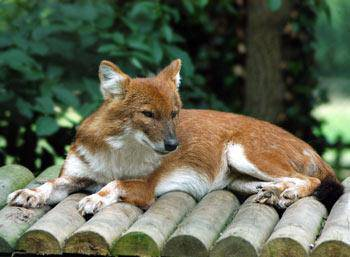

In [ ]:
image

In [ ]:
int(image.max()), int(image.min())

(255, 0)

In [ ]:
# Turn image into Tensors
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seem what an image looks as a Tensor, let's make a function to preprocess them.

1. Take an imgae filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpeg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colore channel values from 0-255 to 0-1 vlaues
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  # Return the image
  return image


In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## Turing our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go...
they all might not fit into memory.
So that's why we do about 32 (this is the batch size) images at a
time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image , label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label


In [ ]:
print(X[42])
print(Y[42])

drive/MyDrive/Deep Learning/dog-breed-identification/train/011e06760794850c40f23d6426c40774.jpg
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
  True False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


In [ ]:
# Demo of the above
(image, label) = get_image_label(X[42], Y[42])
label

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
image

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [ ]:
(process_image(X[42])), tf.constant(Y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn  all of ur data (X & Y) into batches!

Read from here

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (Y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if
  it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset , we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))# only filepaths (no labels)
    data_batch = data .map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the dat is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(Y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create  (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating training data batches....
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Visualizing Data Batches

Our data is now in batches, however, thse can be a little hard to understand/comprehend, let's vusualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rowa , 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the little
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
train_image, train_label = next(train_data.as_numpy_iterator())


In [ ]:
train_image.shape

(32, 224, 224, 3)

In [ ]:
train_label.shape


(32, 120)

In [ ]:
print(len(train_label[0]))
print(len(train_label))
train_label

120
32


array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

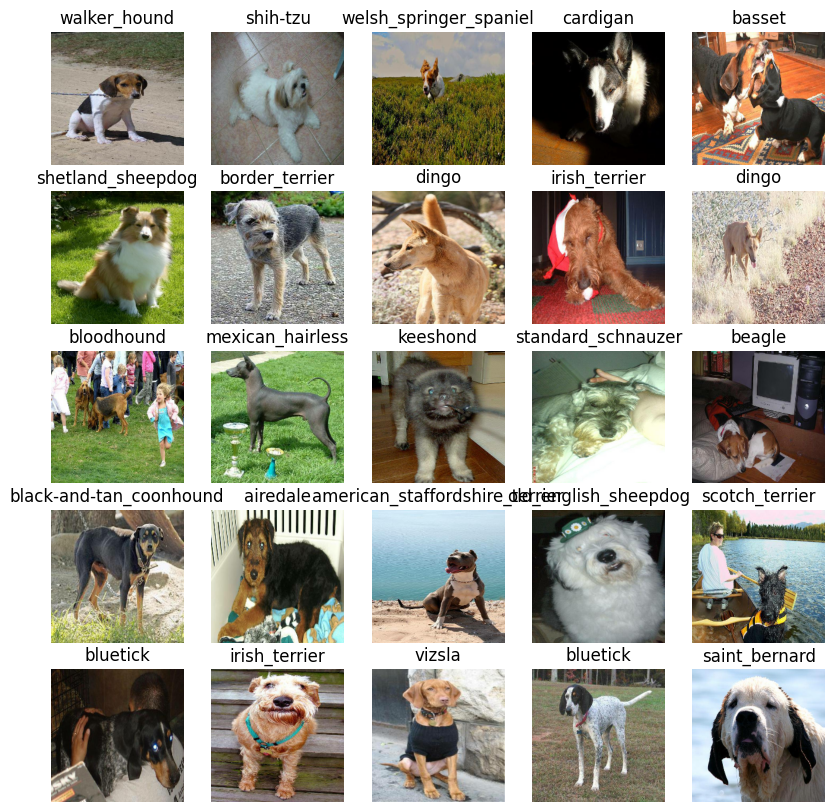

In [ ]:
# Now let's visulatize the data in a training batch
show_25_images(train_image, train_label)

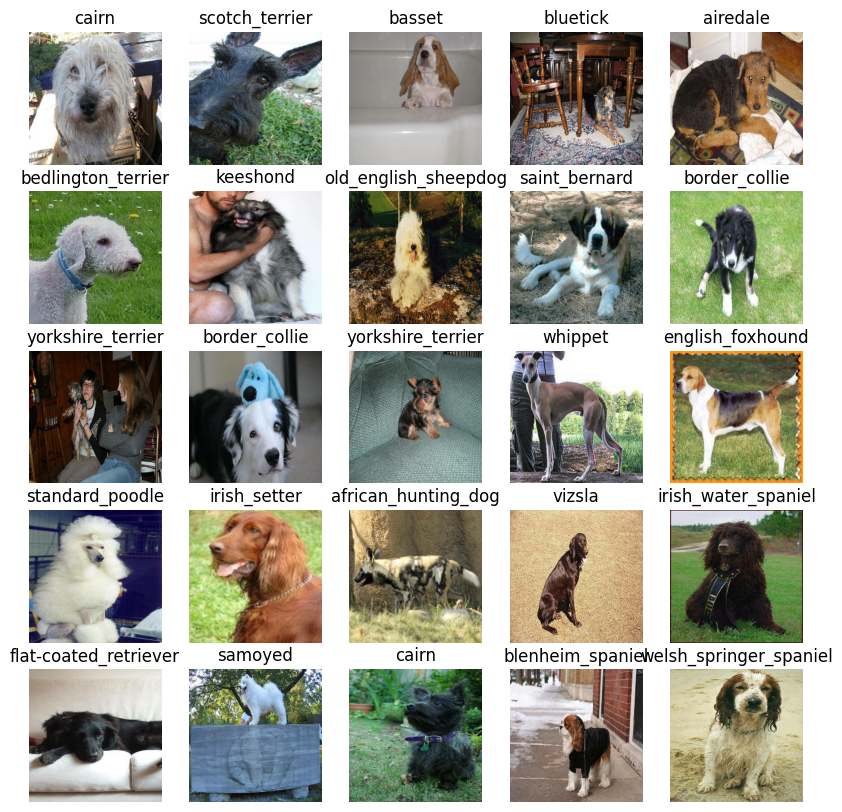

In [ ]:
# Now let's visulatize our validation set
val_image, val_label = next(val_data.as_numpy_iterator())
show_25_images(val_image, val_label)

## Building a model

Before we building a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4.

In [ ]:
# Setup input shape to the model
# INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels
INPUT_SHAPE = (224, 224)
# Setup output shape of our model
OUTPUT_SHAPE  = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go.
Let's put the together into a Keras deep learning model!

Knowing this, let's create a function which contain:
* Takes the input shape, output shape and model we've chosen as parameters.
* Difines the layers in a Keras model in sequential fashion(do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tell the model the input shpae it'll be getting).
* Returns the model.

In [ ]:
import tensorflow as tf
import tf_keras as tfk
import tensorflow_hub as hub

def create_model(input_shape=INPUT_SHAPE,
                 output_shape=OUTPUT_SHAPE,
                 module=MODEL_URL):
  print("Building Model with {}".format(module))

  predtrained_model_without_top_layer = tfk.Sequential([
  hub.KerasLayer("https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/140-224-feature-vector/2",
                 input_shape=INPUT_SHAPE+(3,), trainable=False)
                                                              ])

  model = tfk.Sequential([
      predtrained_model_without_top_layer,
      tfk.layers.Dense(120, activation="softmax")
  ])

  model.compile(loss="categorical_crossentropy",
                optimizer='adam',
                metrics=["accuracy"])
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building Model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 1792)              4363712   
                                                                 
 dense (Dense)               (None, 120)               215160    
                                                                 
Total params: 4578872 (17.47 MB)
Trainable params: 215160 (840.47 KB)
Non-trainable params: 4363712 (16.65 MB)
_________________________________________________________________


In [ ]:
print(tf.__version__)

2.18.0


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which hepls track our models progress and another for early stopping which prevents our model form training for too long.

### TensorBoard Callbacks

To setup a TensorBoard callback , we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic funciton (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import tensorflow as tf
import os
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Deep Learning/dog-breed-identification/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir=logdir)

### Early Stopping CallBack

Early stoping helps stop our model form overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Creates early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model(on subset of data)

Our first model is only gonig to train on 1000 imaages, to make sure everything
is working.

In [ ]:
NUM_EPOCHS = 10 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!)" if tf.config.list_physical_devices("GPU") else "not availabel: ")

GPU available (YESSS!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`.
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use.
* Return the model.

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# # Build a function to train and return a trained model
# def train_model():
#   """
#   Trains a given model and returns the trained version.
#   """
#   # Create a model
#   model = create_model()


#   logdir = os.path.join(
#         "/content/drive/MyDrive/Deep Learning/dog-breed-identification/logs",
#         datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#   )

#   # Create new TensorBoard session everytime we train a model
#   # tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)
#   tensorboard_callback = create_tensorboard_callback()

#   # Fit the model to the data passing it the callbacks we created
#   model.fit(x=train_data,
#             epochs=NUM_EPOCHS,
#             validation_data=val_data,
#             validation_freq=1,
#             callbacks=[logdir, early_stopping])
#   # Return the fitted model
#   return model

In [ ]:
 model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1)

Epoch 1/10
25/25 [==============================] - 213s 8s/step - loss: 4.1167 - accuracy: 0.1912 - val_loss: 3.0382 - val_accuracy: 0.3450
Epoch 2/10
25/25 [==============================] - 5s 199ms/step - loss: 1.2600 - accuracy: 0.8200 - val_loss: 1.8045 - val_accuracy: 0.5750
Epoch 3/10
25/25 [==============================] - 4s 164ms/step - loss: 0.4324 - accuracy: 0.9613 - val_loss: 1.4071 - val_accuracy: 0.6800
Epoch 4/10
25/25 [==============================] - 4s 154ms/step - loss: 0.2168 - accuracy: 0.9912 - val_loss: 1.3130 - val_accuracy: 0.6700
Epoch 5/10
25/25 [==============================] - 4s 152ms/step - loss: 0.1407 - accuracy: 0.9975 - val_loss: 1.2607 - val_accuracy: 0.7100
Epoch 6/10
25/25 [==============================] - 5s 198ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 1.2315 - val_accuracy: 0.6800
Epoch 7/10
25/25 [==============================] - 4s 161ms/step - loss: 0.0753 - accuracy: 1.0000 - val_loss: 1.1981 - val_accuracy: 0.7200
Epoch 8

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir 'drive/MyDrive/Deep Learning/dog-breed-identification/logs'

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model.


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predinctions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 98ms/step


array([[1.7631648e-03, 6.3562312e-04, 5.7877012e-04, ..., 1.3157881e-04,
        4.4704506e-05, 1.0612158e-03],
       [9.4476277e-03, 1.1621997e-03, 1.1848111e-02, ..., 4.0700436e-03,
        8.1902702e-04, 1.0998725e-02],
       [1.1269610e-05, 1.3269953e-04, 1.9340857e-04, ..., 3.8008124e-04,
        5.7069137e-06, 1.4622662e-03],
       ...,
       [3.5159874e-06, 1.6651019e-03, 7.2651118e-04, ..., 3.6198486e-04,
        7.2986954e-06, 3.9060879e-04],
       [5.8440311e-04, 5.1569139e-05, 3.1396779e-04, ..., 1.4924773e-04,
        4.1218151e-05, 8.5624019e-03],
       [2.8766692e-04, 4.7337784e-05, 1.2201702e-03, ..., 4.0235599e-03,
        7.5704925e-04, 1.3483324e-04]], dtype=float32)

In [ ]:
predictions[0].argmax()

np.int64(26)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(Y_val)

200

In [ ]:
# First rediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.03262801e-05 9.39484962e-05 3.91094422e-04 2.29274283e-05
 1.75661407e-03 2.41358412e-05 4.60354458e-05 2.22536456e-03
 1.35181947e-02 3.88041846e-02 3.13893470e-05 3.25396140e-05
 2.60955829e-04 5.36393654e-03 9.10577830e-04 6.03614422e-03
 3.74957526e-05 1.25446779e-04 1.50374864e-04 4.93562431e-04
 5.03496449e-06 6.94873568e-04 1.50459564e-05 2.43704635e-05
 5.27085736e-03 3.49636866e-05 8.84665587e-06 1.26225626e-04
 1.77536713e-04 1.68820130e-04 1.57216600e-05 8.00559574e-05
 9.93221693e-05 1.13431313e-04 2.49705299e-05 6.04222587e-05
 8.10689107e-06 6.54671690e-04 7.23459889e-05 7.07041442e-01
 1.15482377e-04 1.04610044e-05 1.95818162e-03 4.56241651e-05
 4.53981265e-05 8.20592595e-06 3.63358558e-05 8.79112747e-04
 5.16813561e-05 3.06642440e-04 5.00725655e-05 1.19648976e-04
 1.95003595e-04 9.86960600e-04 9.33167667e-06 1.33146066e-03
 3.94534873e-05 9.92447167e-05 1.10607420e-04 6.87213396e-05
 2.35847270e-04 6.75687988e-05 1.40933280e-05 2.52798891e-05
 1.24769809e-04 8.601300

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is begin make on!

**Note**: Prediction probabilities are alos known as confidence levels.

In [ ]:
# Turn predicition probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilites into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[42])
pred_label

'english_foxhound'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and the compare those predictions to the validation labels (turth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """

  images_ = []
  labels_ = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    breed_index = np.argmax(label)
    labels_.append(label)
  return images_, labels_

  # Unbatchify the validation data
  val_images, val_labels = unbatchify(val_data)
  val_images[0], val_labels[0]

  print(val_labels[0])

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
### This is simple version of above function ###
# images_1 = []
# labels_1 = []

# # Loop through unbatched data
# for image, label in val_data.unbatch().as_numpy_iterator():
#   images_1.append(image)
#   labels_1.append(label)

# images_1[0],labels_1[0]

# print(get_pred_label(labels_1[0]))
# print(get_pred_label(predictions[0]))

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth and image for sample n
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image and remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the colour of the tilte depending on if the prediction is right or wrong
    if pred_label == get_pred_label(true_label):
      color = "green"
    else:
      color = "red"

    # Change plot title to be predicted, probabililty of prediction and truth label
    plt.title("{} {:2.0f}%   {}".format(pred_label,
                                       np.max(pred_prob)*100,
                                       (get_pred_label(true_label))),
                                        color=color)


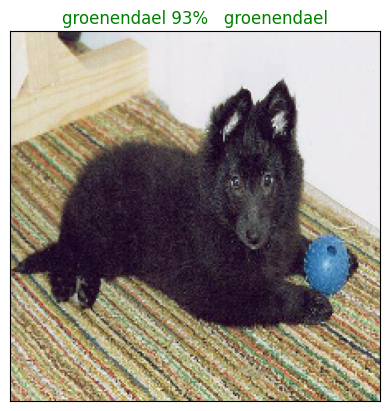

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of prediciton probabilites array and a ground truth  array and an integer
* Find the prediction using  'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction proabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1, ax=None):
    """
    Plots the top 10 highest prediction confidences along with the true label
    for sample n.
    """
    pred_prob = prediction_probabilities[n]

    # Convert one-hot label to breed name if necessary
    true_label = labels[n]
    if not isinstance(true_label, str):
        true_label = unique_breeds[np.where(true_label)[0][0]]  # fix for one-hot

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")
    plt.title(f"Top Predictions for Sample {n}\nTrue: {true_label} | Pred: {pred_label}")
    plt.ylabel("Prediction Confidence")

    # Highlight true label if present
    if true_label in top_10_pred_labels:
        match_idx = np.where(top_10_pred_labels == true_label)[0][0]
        top_plot[match_idx].set_color("green")


In [ ]:
true_label = unique_breeds[np.where(labels[9])[0][0]]


/tmp/ipython-input-89-3331451958.py:1: DeprecationWarning: Calling nonzero on 0d arrays is deprecated, as it behaves surprisingly. Use `atleast_1d(arr).nonzero()` if the old behavior was intended.
  true_label = unique_breeds[np.where(labels[9])[0][0]]


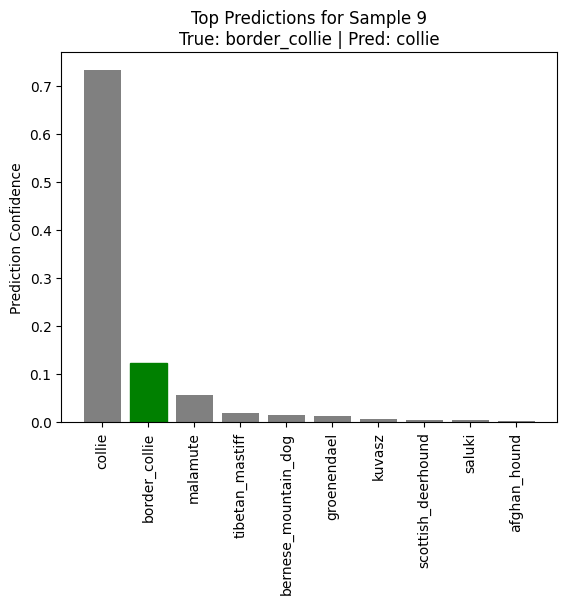

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [ ]:
new_pred = predictions[0][predictions[0].argsort()[-10:][::-1]]


In [ ]:
new_pred

array([0.60656065, 0.07628866, 0.07055308, 0.03952585, 0.02166712,
       0.02124257, 0.01956024, 0.01785121, 0.01762436, 0.01530857],
      dtype=float32)

In [ ]:
predictions[0].max()

np.float32(0.60656065)

In [ ]:
unique_breeds[np.argmax(predictions[0])]

'cairn'

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

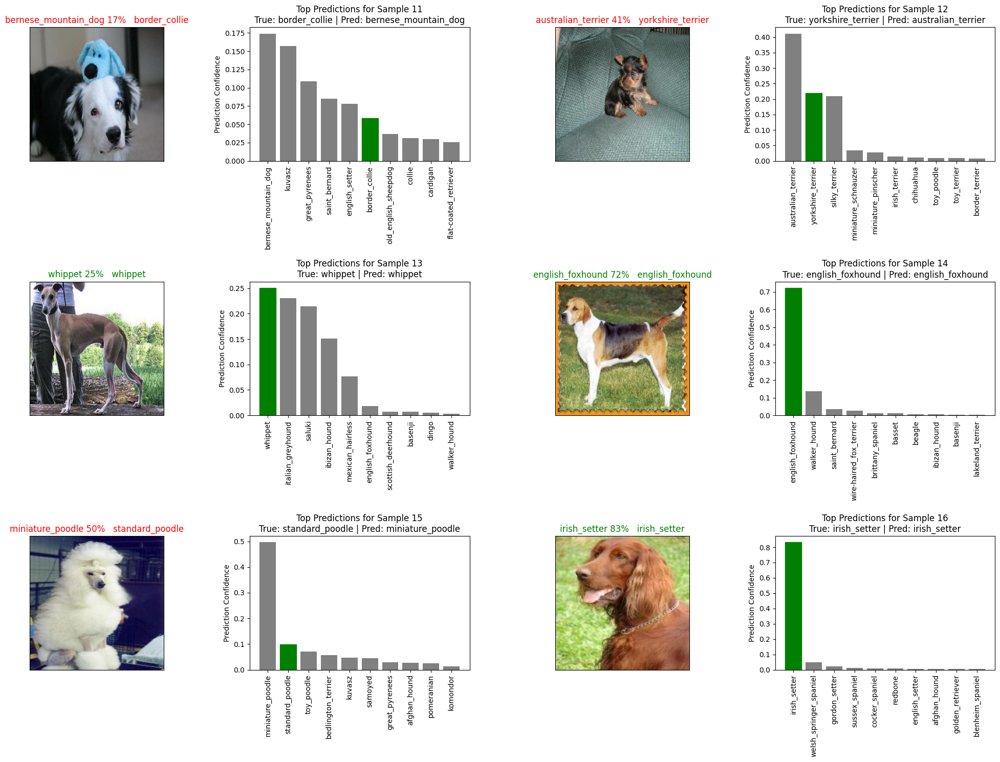

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 11
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(5 * 2 * num_cols, 5 * num_rows))

for i in range(num_images):
    index = i + i_multiplier

    # Image on the left
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=index)

    # Confidence bar chart on the right
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=index)

plt.tight_layout(h_pad=1.5)
plt.show()


## Saving and reloading a trained model

In [ ]:
# Crate a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory path name with current time
  modeldir = os.path.join("/content/drive/MyDrive/Deep Learning/dog-breed-identification/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save a model trained on 1000 images
model_path = save_model(model, suffix="all-images-Adam")

Saving model to: /content/drive/MyDrive/Deep Learning/dog-breed-identification/Models/20250628-061937-all-images-Adam.h5....


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model_path

'/content/drive/MyDrive/Deep Learning/dog-breed-identification/Models/20250628-061937-all-images-Adam.h5'

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 89ms/step - loss: 1.1581 - accuracy: 0.7100


[1.1580851078033447, 0.7099999785423279]

## Training a big dog model(on the full data)

In [ ]:
len(X), len(Y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Deep Learning/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Deep Learning/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, Y)

Creating training data batches....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
len(full_data)

320

In [ ]:
# Create a model for full model
full_model = create_model()

Building Model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                       patience=3)

In [ ]:
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS #put epochs = 15
)

Epoch 1/10
320/320 [==============================] - 41s 110ms/step - loss: 1.2174 - accuracy: 0.6975
Epoch 2/10
320/320 [==============================] - 37s 115ms/step - loss: 0.3411 - accuracy: 0.9043
Epoch 3/10
320/320 [==============================] - 37s 115ms/step - loss: 0.1947 - accuracy: 0.9512
Epoch 4/10
320/320 [==============================] - 36s 112ms/step - loss: 0.1196 - accuracy: 0.9779
Epoch 5/10
320/320 [==============================] - 35s 110ms/step - loss: 0.0813 - accuracy: 0.9887
Epoch 6/10
320/320 [==============================] - 35s 110ms/step - loss: 0.0577 - accuracy: 0.9943
Epoch 7/10
320/320 [==============================] - 36s 113ms/step - loss: 0.0431 - accuracy: 0.9972
Epoch 8/10
320/320 [==============================] - 36s 112ms/step - loss: 0.0337 - accuracy: 0.9981
Epoch 9/10
320/320 [==============================] - 36s 114ms/step - loss: 0.0270 - accuracy: 0.9985
Epoch 10/10
320/320 [==============================] - 37s 117ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetx2-Adam")

Saving model to: /content/drive/MyDrive/Deep Learning/dog-breed-identification/Models/20250628-062058-full-image-set-mobilenetx2-Adam.h5....


'/content/drive/MyDrive/Deep Learning/dog-breed-identification/Models/20250628-062058-full-image-set-mobilenetx2-Adam.h5'

In [ ]:
len(X)

10222